In [1]:
### Python
import os
import random
import time
import pandas as pd
import numpy as np
import copy
import matplotlib.pyplot as plt
from math import ceil

### Pytorch
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import torch.utils.data as data
import segmentation_models_pytorch as smp
import torchvision
from torchvision import transforms
import torchvision.transforms.functional as TF
from torchsummary import summary

### Others
from tqdm import tqdm
from scipy.ndimage import gaussian_filter

### Images
import cv2
from PIL import Image

#my classes
import dataset as customdataset
import my_functions
import models

C:\Users\hilar\anaconda3\envs\NNDL_torch\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Set seeds for reproducibility (PyTorch, Python, Numpy)
matricola = 2013031
torch.manual_seed(matricola)
random.seed(matricola)
np.random.seed(matricola)

In [3]:
path = "C:/Users/hilar/Documents/Data/GitHub/Vision_Cognitive_Systems_Proyect/Corn/corn_kenel_counting_dataset/corn_kenel_counting_dataset/"

categorie = "corn"

train_csv_positions  = path + f"{categorie}_coco/{categorie}_kernel_train_positions.csv" 
train_csv_info       = path + f"{categorie}_coco/{categorie}_kernel_train_info.csv"
train_data_path = path + f"{categorie}_coco" 

test_csv_positions  = path + f"{categorie}_coco/{categorie}_kernel_test_positions.csv" 
test_csv_info       = path + f"{categorie}_coco/{categorie}_kernel_test_info.csv"
test_data_path = path + f"{categorie}_coco" 

In [4]:
### Define dataset
train_dataset = customdataset.CustomImageDataset(train_csv_positions,train_csv_info,train_data_path,
                                           threshold=1e-4,re_scale=1e5,
                                           img_transforms=transforms.ToTensor(),
                                           mask_transforms=transforms.ToTensor(),
                                           I_M_transforms=None)

test_dataset = customdataset.CustomImageDataset(test_csv_positions,test_csv_info,test_data_path,
                                           threshold=1e-4,re_scale=1e5,
                                           img_transforms=transforms.ToTensor(),
                                           mask_transforms=transforms.ToTensor(),
                                           I_M_transforms=None)

In [5]:
print("max",train_dataset[0][0].amax(axis= [1,2]))
print("min",train_dataset[0][0].amin(axis= [1,2]))

train_mean, train_std = my_functions.dataset_mean_std(train_dataset)
# Mean and std should be divided by 255 (maximum pixel value)
# because, after the ToTensor() transformation (see next step), images are normalized
# between 0 and 1.
#train_mean, train_std =train_mean/255, train_std/255
# output
print('mean: '  + str(train_mean))
print('std:  '  + str(train_std))

max tensor([1., 1., 1.])
min tensor([0., 0., 0.])
mean: tensor([0.5070, 0.4383, 0.3099])
std:  tensor([0.2985, 0.2740, 0.2705])


In [6]:
# Split train data into train and validation sets
# (10% of training set will be used as validation set)
num_train_examples = int(len(train_dataset) * 0.80)
num_valid_examples = len(train_dataset) - num_train_examples

print(f"Number of training examples: {num_train_examples}")

Number of training examples: 193


In [7]:
# Create 'Subset' objects
train_dataset, validation_dataset = data.random_split(train_dataset, [num_train_examples, num_valid_examples])

print(f"Number training examples: {len(train_dataset)}")
print(f"Number validation examples: {len(validation_dataset)}")
print(f"Number test examples: {len(test_dataset)}")

Number training examples: 193
Number validation examples: 49
Number test examples: 62


In [8]:
# Apply test transformations to the validation set
validation_dataset = copy.deepcopy(validation_dataset) # If we change train transformations, this won't affect the validation set


In [9]:
### Define the data augmentation transforms
### and also the pretrained model standards for Imagenet
# https://discuss.pytorch.org/t/how-to-preprocess-input-for-pre-trained-networks/683/2
# mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]

train_img_transforms = transforms.Compose([
                                        torchvision.transforms.ToTensor(),
                                        transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),
                                        torchvision.transforms.RandomAutocontrast(p=0.4),
                                        torchvision.transforms.ColorJitter(brightness=0, contrast=0, saturation=0.1, hue=0.1),
                                        #transforms.Resize((320,320)),
                                        ])

train_geometric_transforms = transforms.Compose([
                                           customdataset.padding(384,640),
                                           customdataset.Random_Cropping(384,640),
                                           customdataset.MyRotations(),
                                          ])
lbl_transforms = transforms.Compose([
                                          torchvision.transforms.ToTensor(),
                                          #transforms.Resize((320,320)),
                                          ])

validation_img_transforms = transforms.Compose([
                                               torchvision.transforms.ToTensor(),
                                               transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),
                                               #transforms.Resize((320,320)),
                                               ])

validation_geometric_transforms = transforms.Compose([
                                                      customdataset.padding(384,640),
                                                      customdataset.Random_Cropping(384,640),
                                                     ])

# validation_lbl_transforms = transforms.Compose([
#                                                torchvision.transforms.ToTensor(),
#                                                #transforms.Resize((320,320)),
#                                                ])

test_img_transforms = transforms.Compose([
                                         torchvision.transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),
                                         #transforms.Resize((320,320)),
                                         ])

test_geometric_transforms = transforms.Compose([
                                               #customdataset.padding(384,640),
                                               #customdataset.Random_Cropping(384,640),
                                               ])

# test_lbl_transforms = transforms.Compose([
#                                                torchvision.transforms.ToTensor(),
#                                                #transforms.Resize((320,320)),
#                                                ])

In [10]:
### Update transforms for the datasets and the corresponding iterators
# Train dataset
train_dataset.dataset.I_M_transforms    = train_geometric_transforms
train_dataset.dataset.img_transforms    = train_img_transforms
train_dataset.dataset.mask_transforms   = lbl_transforms
train_dataloader = DataLoader(train_dataset, batch_size=25, shuffle=True, num_workers=0)

# Validation dataset
validation_dataset.dataset.I_M_transforms    = validation_geometric_transforms
validation_dataset.dataset.img_transforms    = validation_img_transforms
validation_dataset.dataset.mask_transforms   = lbl_transforms
validation_dataloader = DataLoader(validation_dataset, batch_size=len(validation_dataset), shuffle=False, num_workers=0)

# test dataset
test_dataset.I_M_transforms    = test_geometric_transforms
test_dataset.img_transforms    = test_img_transforms
test_dataset.mask_transforms   = lbl_transforms
# For flexibility i dont define it
##test_dataloader = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=False, num_workers=0)


Training dataloader 

In [11]:
start_time = time.time()
train_images, train_masks, shape,count = next(iter(train_dataloader))
end_time = time.time()
print(f"Dataloader Time: {end_time-start_time:.2f} s")

Dataloader Time: 15.82 s


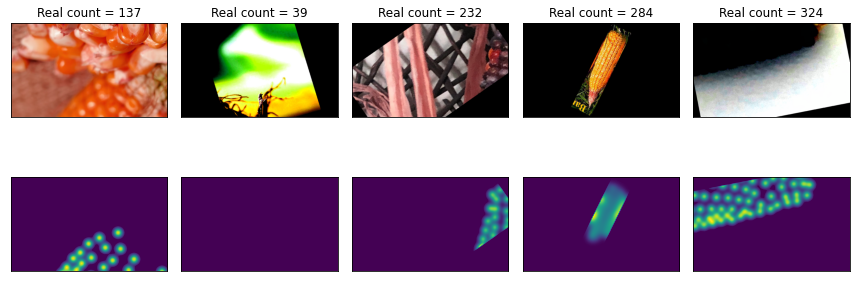

In [12]:
#my_functions.reconstruct_plot_images_masks(train_images, train_masks, shape,count)
my_functions.Non_reconstruct_plot_images_masks(train_images, train_masks, shape,count)

Validation dataloader

In [13]:
start_time = time.time()
validation_images, validation_masks, shape,count = next(iter(validation_dataloader))
end_time = time.time()
print(f"Dataloader Time: {end_time-start_time:.2f} s")

Dataloader Time: 5.64 s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


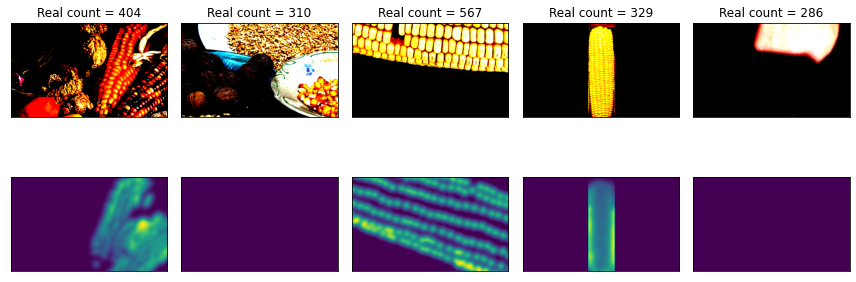

In [14]:
#my_functions.reconstruct_plot_images_masks(test_images, test_masks, shape,count)
my_functions.Non_reconstruct_plot_images_masks(validation_images, validation_masks, shape,count)

Test dataset

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


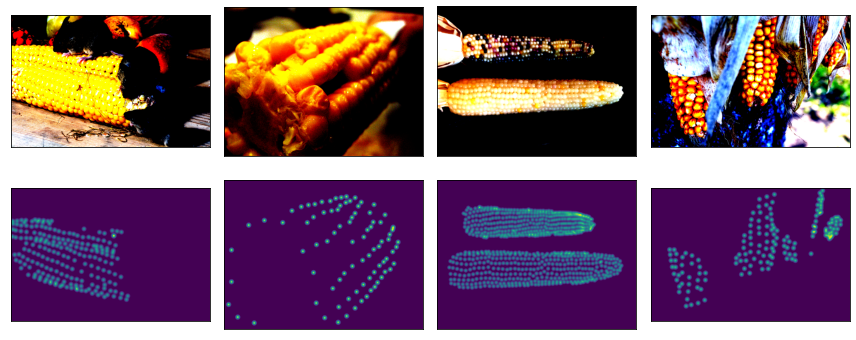

In [15]:
my_functions.plot_dataset_data(test_dataset)

# Architecture

In [19]:
###############
# VGG
###############

### Load pretrained model
VGG16 = smp.Unet('vgg16', encoder_weights='imagenet')
### Define the model
model = VGG16

In [16]:
###############
# mobilenet_v2
###############

### Load pretrained model
MOBILENET = smp.Unet('mobilenet_v2', encoder_weights='imagenet')
### Define the model
model = MOBILENET#models.Map_CNN(backbone)

In [23]:
###############
# efficientnet-b1
###############

### Load pretrained model
EFFICIENTNET = smp.Unet('efficientnet-b1', encoder_weights='imagenet')
### Define the model
model = EFFICIENTNET#models.Map_CNN(backbone)

In [17]:
summary(model, (3, 384, 640))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 192, 320]             864
       BatchNorm2d-2         [-1, 32, 192, 320]              64
             ReLU6-3         [-1, 32, 192, 320]               0
            Conv2d-4         [-1, 32, 192, 320]             288
       BatchNorm2d-5         [-1, 32, 192, 320]              64
             ReLU6-6         [-1, 32, 192, 320]               0
            Conv2d-7         [-1, 16, 192, 320]             512
       BatchNorm2d-8         [-1, 16, 192, 320]              32
  InvertedResidual-9         [-1, 16, 192, 320]               0
           Conv2d-10         [-1, 96, 192, 320]           1,536
      BatchNorm2d-11         [-1, 96, 192, 320]             192
            ReLU6-12         [-1, 96, 192, 320]               0
           Conv2d-13          [-1, 96, 96, 160]             864
      BatchNorm2d-14          [-1, 96, 

In [18]:
### Disable the weight update for the trained encoder
for param_name, param in model.encoder.named_parameters():
    param.requires_grad = False

### Allow weight update (training) of the last layers (linear layers)
for param in model.decoder.parameters():
    param.requires_grad = True

### Check which weights and biases will be updated
for param_name, param in model.named_parameters():
    print(param_name,param.requires_grad)

encoder.features.0.0.weight False
encoder.features.0.1.weight False
encoder.features.0.1.bias False
encoder.features.1.conv.0.0.weight False
encoder.features.1.conv.0.1.weight False
encoder.features.1.conv.0.1.bias False
encoder.features.1.conv.1.weight False
encoder.features.1.conv.2.weight False
encoder.features.1.conv.2.bias False
encoder.features.2.conv.0.0.weight False
encoder.features.2.conv.0.1.weight False
encoder.features.2.conv.0.1.bias False
encoder.features.2.conv.1.0.weight False
encoder.features.2.conv.1.1.weight False
encoder.features.2.conv.1.1.bias False
encoder.features.2.conv.2.weight False
encoder.features.2.conv.3.weight False
encoder.features.2.conv.3.bias False
encoder.features.3.conv.0.0.weight False
encoder.features.3.conv.0.1.weight False
encoder.features.3.conv.0.1.bias False
encoder.features.3.conv.1.0.weight False
encoder.features.3.conv.1.1.weight False
encoder.features.3.conv.1.1.bias False
encoder.features.3.conv.2.weight False
encoder.features.3.conv.3.

In [19]:
summary(model, (3, 384, 640))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 192, 320]             864
       BatchNorm2d-2         [-1, 32, 192, 320]              64
             ReLU6-3         [-1, 32, 192, 320]               0
            Conv2d-4         [-1, 32, 192, 320]             288
       BatchNorm2d-5         [-1, 32, 192, 320]              64
             ReLU6-6         [-1, 32, 192, 320]               0
            Conv2d-7         [-1, 16, 192, 320]             512
       BatchNorm2d-8         [-1, 16, 192, 320]              32
  InvertedResidual-9         [-1, 16, 192, 320]               0
           Conv2d-10         [-1, 96, 192, 320]           1,536
      BatchNorm2d-11         [-1, 96, 192, 320]             192
            ReLU6-12         [-1, 96, 192, 320]               0
           Conv2d-13          [-1, 96, 96, 160]             864
      BatchNorm2d-14          [-1, 96, 

In [20]:
max_epochs        = 60
learning_rate     = 5e-4

In [21]:
### Define the loss function for reconstruction
loss_fn = nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

#Send model to device
model.to(device)

Selected device: cpu


Unet(
  (encoder): MobileNetV2Encoder(
    (features): Sequential(
      (0): ConvNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): ConvNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): ConvNormActivation(
            (0): Conv2d(16, 96, kernel_size=(1, 1), 

  0%|                                                                                           | 0/60 [00:00<?, ?it/s]


Epoch: 1/60 -- Epoch Time: 374.56 s
---------------------------------
Train -- Loss: 5048.716
Val -- Loss: 3106.094


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


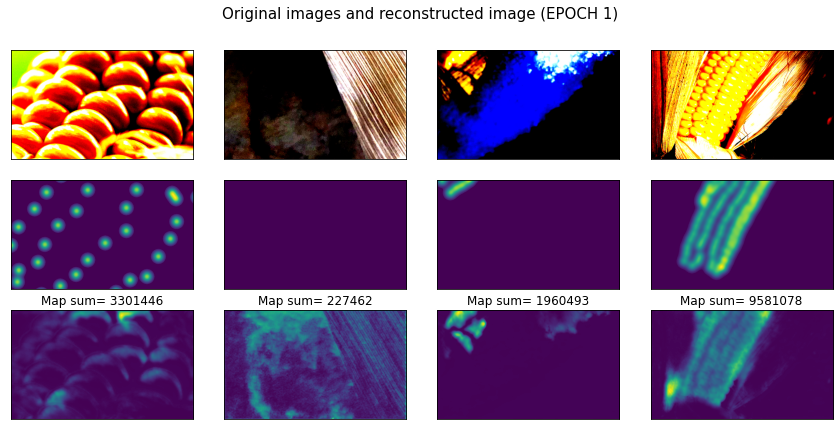

  3%|██▋                                                                             | 2/60 [13:30<6:36:07, 409.79s/it]


Epoch: 2/60 -- Epoch Time: 431.28 s
---------------------------------
Train -- Loss: 4763.460
Val -- Loss: 3603.421

Epoch: 3/60 -- Epoch Time: 324.35 s
---------------------------------
Train -- Loss: 4664.720
Val -- Loss: 3588.367


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


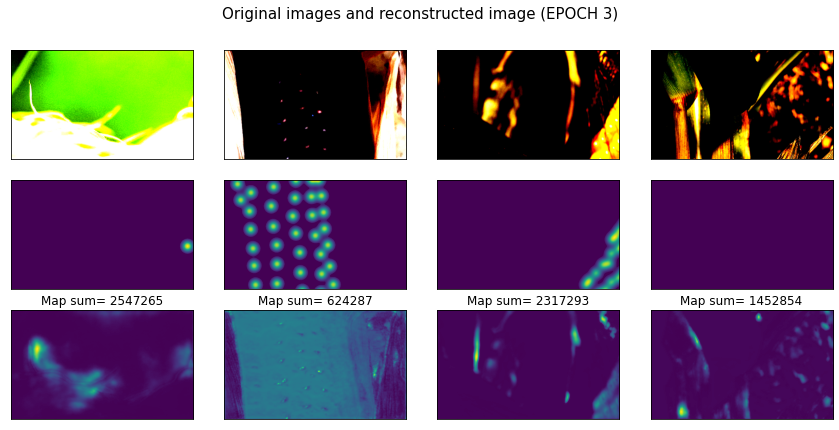

  7%|█████▎                                                                          | 4/60 [24:06<5:24:04, 347.23s/it]


Epoch: 4/60 -- Epoch Time: 308.84 s
---------------------------------
Train -- Loss: 4747.752
Val -- Loss: 3380.185

Epoch: 5/60 -- Epoch Time: 307.78 s
---------------------------------
Train -- Loss: 4523.050
Val -- Loss: 3190.928


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


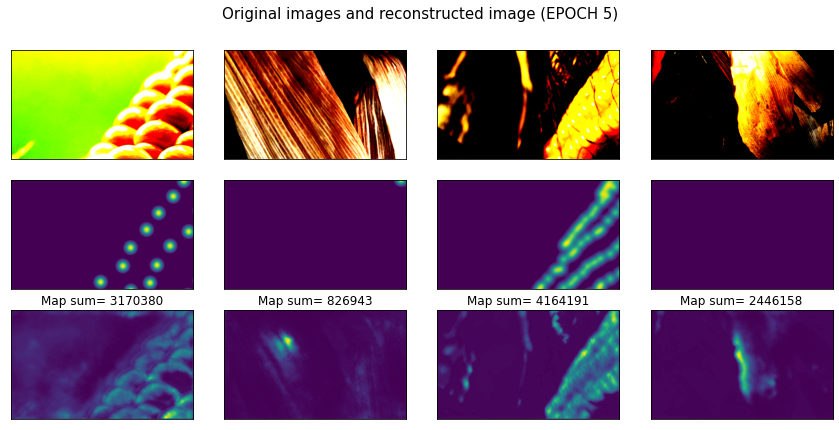

 10%|████████                                                                        | 6/60 [34:20<4:51:11, 323.55s/it]


Epoch: 6/60 -- Epoch Time: 303.01 s
---------------------------------
Train -- Loss: 4856.808
Val -- Loss: 3320.272

Epoch: 7/60 -- Epoch Time: 303.60 s
---------------------------------
Train -- Loss: 4965.966
Val -- Loss: 2796.521


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


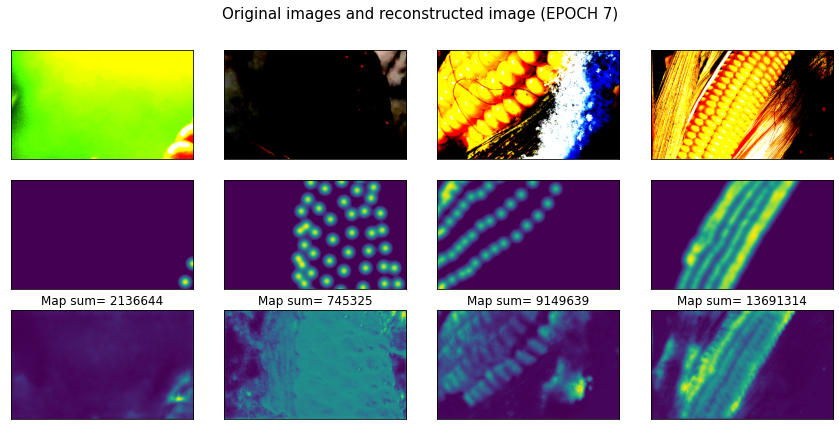

 13%|██████████▋                                                                     | 8/60 [44:31<4:31:51, 313.69s/it]


Epoch: 8/60 -- Epoch Time: 303.95 s
---------------------------------
Train -- Loss: 4641.848
Val -- Loss: 3773.696

Epoch: 9/60 -- Epoch Time: 302.72 s
---------------------------------
Train -- Loss: 4917.884
Val -- Loss: 3328.676


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


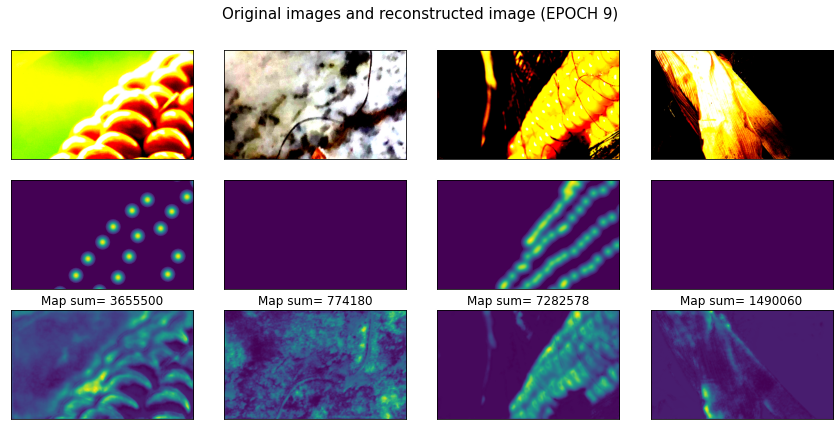

 17%|█████████████▏                                                                 | 10/60 [54:40<4:17:06, 308.53s/it]


Epoch: 10/60 -- Epoch Time: 302.35 s
---------------------------------
Train -- Loss: 5144.389
Val -- Loss: 3394.282

Epoch: 11/60 -- Epoch Time: 303.02 s
---------------------------------
Train -- Loss: 4408.433
Val -- Loss: 3570.236


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


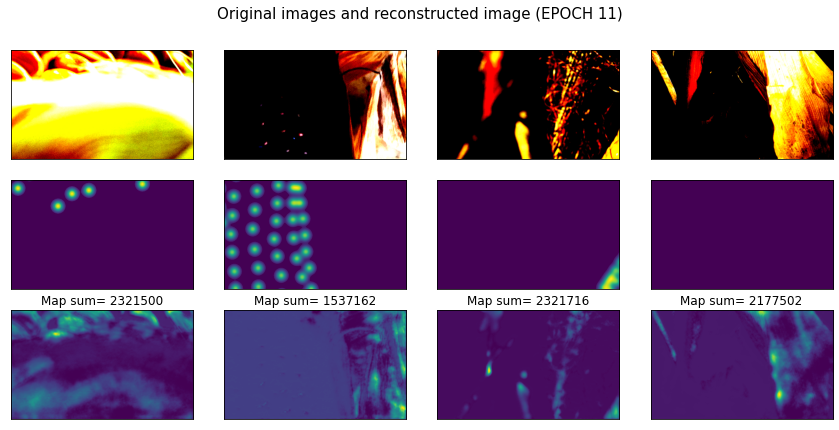

 20%|███████████████▍                                                             | 12/60 [1:04:50<4:05:25, 306.78s/it]


Epoch: 12/60 -- Epoch Time: 304.42 s
---------------------------------
Train -- Loss: 3818.022
Val -- Loss: 4290.641

Epoch: 13/60 -- Epoch Time: 304.99 s
---------------------------------
Train -- Loss: 4366.395
Val -- Loss: 3592.768


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


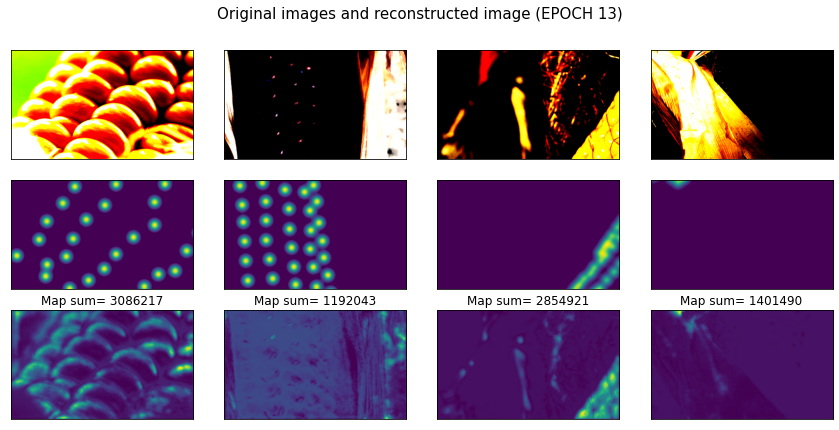

 23%|█████████████████▉                                                           | 14/60 [1:15:02<3:54:38, 306.05s/it]


Epoch: 14/60 -- Epoch Time: 303.41 s
---------------------------------
Train -- Loss: 4140.933
Val -- Loss: 2737.316

Epoch: 15/60 -- Epoch Time: 305.62 s
---------------------------------
Train -- Loss: 4692.219
Val -- Loss: 2403.776


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


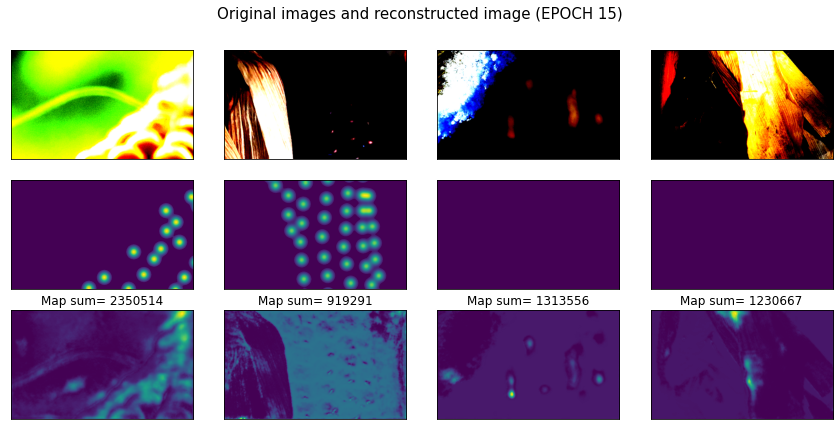

 27%|████████████████████▌                                                        | 16/60 [1:25:15<3:44:30, 306.16s/it]


Epoch: 16/60 -- Epoch Time: 304.58 s
---------------------------------
Train -- Loss: 5327.774
Val -- Loss: 20167.188

Epoch: 17/60 -- Epoch Time: 303.56 s
---------------------------------
Train -- Loss: 4862.658
Val -- Loss: 7867.947


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


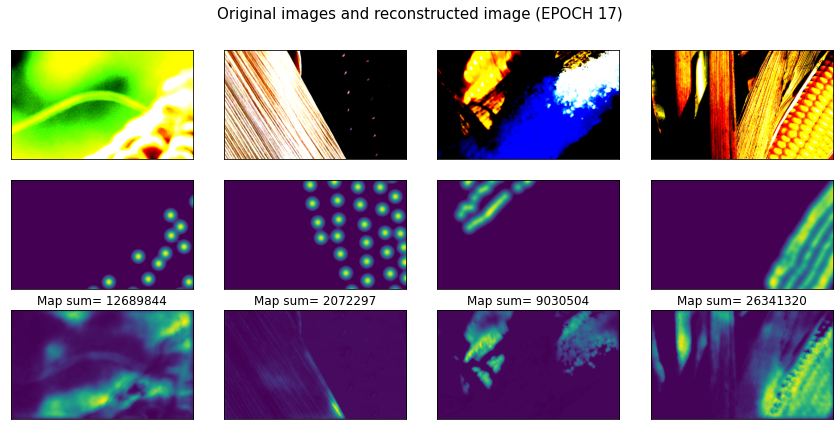

 30%|███████████████████████                                                      | 18/60 [1:35:23<3:33:19, 304.75s/it]


Epoch: 18/60 -- Epoch Time: 301.16 s
---------------------------------
Train -- Loss: 3727.824
Val -- Loss: 3960.958

Epoch: 19/60 -- Epoch Time: 303.61 s
---------------------------------
Train -- Loss: 3951.325
Val -- Loss: 3083.284


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


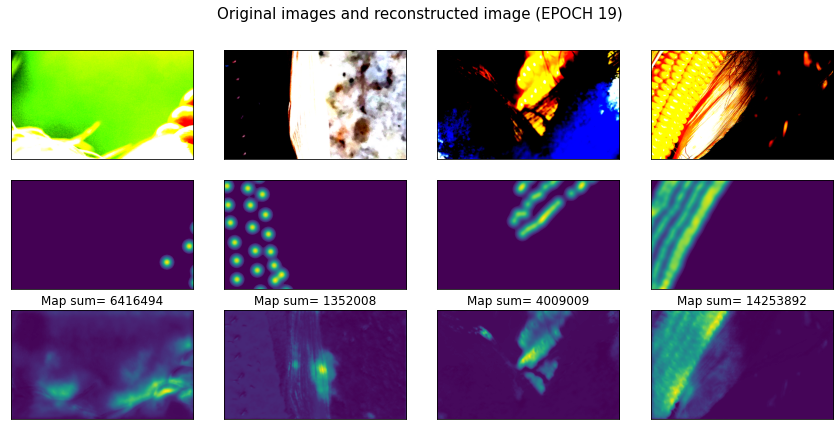

 33%|█████████████████████████▋                                                   | 20/60 [1:45:34<3:23:17, 304.94s/it]


Epoch: 20/60 -- Epoch Time: 303.91 s
---------------------------------
Train -- Loss: 4444.545
Val -- Loss: 3147.537

Epoch: 21/60 -- Epoch Time: 302.51 s
---------------------------------
Train -- Loss: 3659.654
Val -- Loss: 2830.771


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


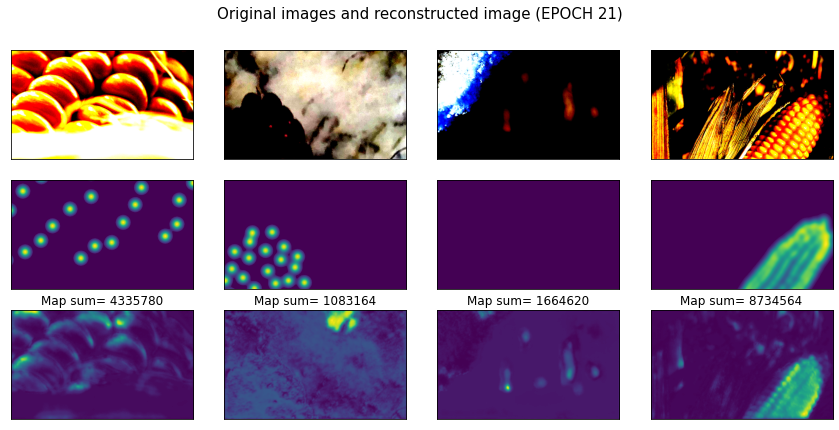

 37%|████████████████████████████▏                                                | 22/60 [1:55:43<3:12:55, 304.61s/it]


Epoch: 22/60 -- Epoch Time: 302.91 s
---------------------------------
Train -- Loss: 3518.294
Val -- Loss: 2869.221

Epoch: 23/60 -- Epoch Time: 303.18 s
---------------------------------
Train -- Loss: 3972.209
Val -- Loss: 2912.310


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


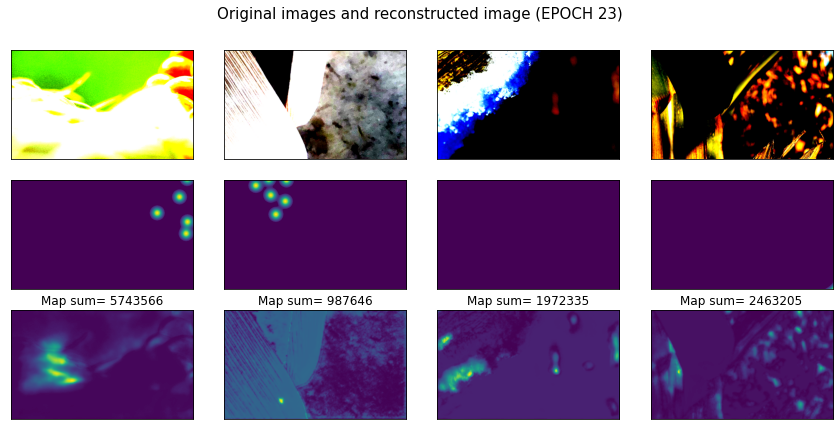

 40%|██████████████████████████████▊                                              | 24/60 [2:05:52<3:02:37, 304.38s/it]


Epoch: 24/60 -- Epoch Time: 302.63 s
---------------------------------
Train -- Loss: 3648.405
Val -- Loss: 2788.725

Epoch: 25/60 -- Epoch Time: 305.16 s
---------------------------------
Train -- Loss: 3973.325
Val -- Loss: 3190.490


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


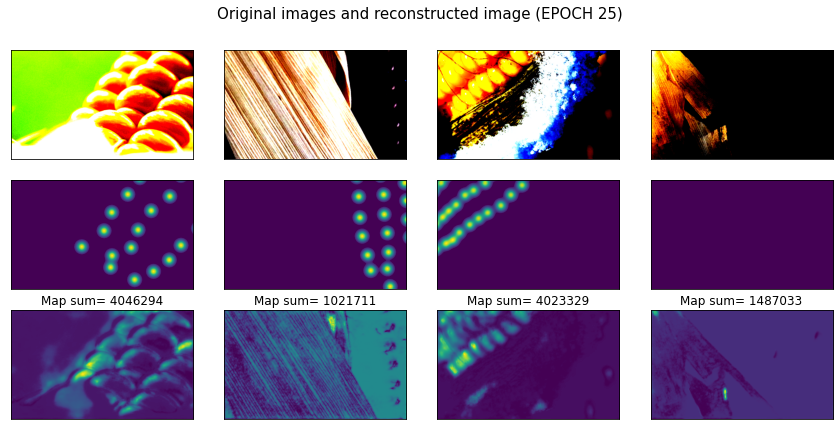

 43%|█████████████████████████████████▎                                           | 26/60 [2:16:05<2:53:02, 305.36s/it]


Epoch: 26/60 -- Epoch Time: 304.92 s
---------------------------------
Train -- Loss: 3921.397
Val -- Loss: 2794.943

Epoch: 27/60 -- Epoch Time: 304.13 s
---------------------------------
Train -- Loss: 3582.922
Val -- Loss: 3006.439


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


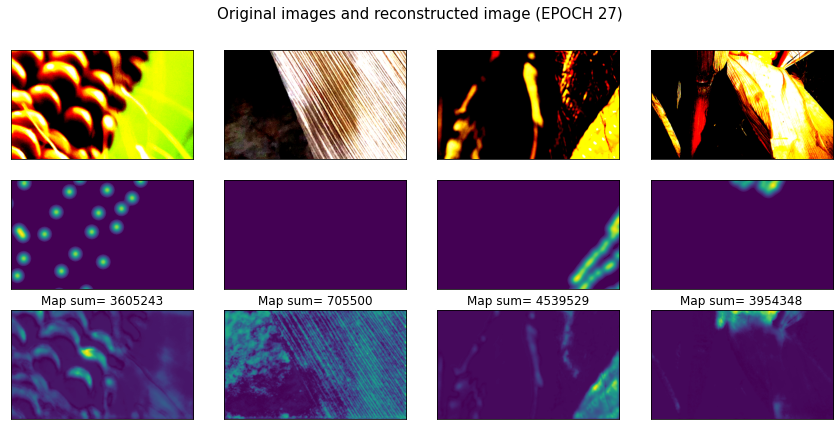

 47%|███████████████████████████████████▉                                         | 28/60 [2:34:33<4:02:22, 454.47s/it]


Epoch: 28/60 -- Epoch Time: 800.96 s
---------------------------------
Train -- Loss: 3029.176
Val -- Loss: 3427.133

Epoch: 29/60 -- Epoch Time: 763.51 s
---------------------------------
Train -- Loss: 3828.816
Val -- Loss: 2692.094


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


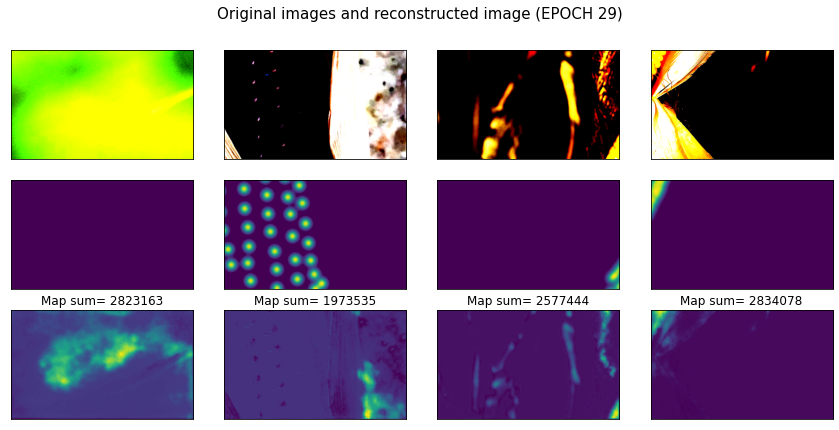

 50%|██████████████████████████████████████▌                                      | 30/60 [2:59:31<5:01:21, 602.71s/it]


Epoch: 30/60 -- Epoch Time: 727.62 s
---------------------------------
Train -- Loss: 3583.250
Val -- Loss: 3146.670

Epoch: 31/60 -- Epoch Time: 720.17 s
---------------------------------
Train -- Loss: 3943.862
Val -- Loss: 4555.188


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


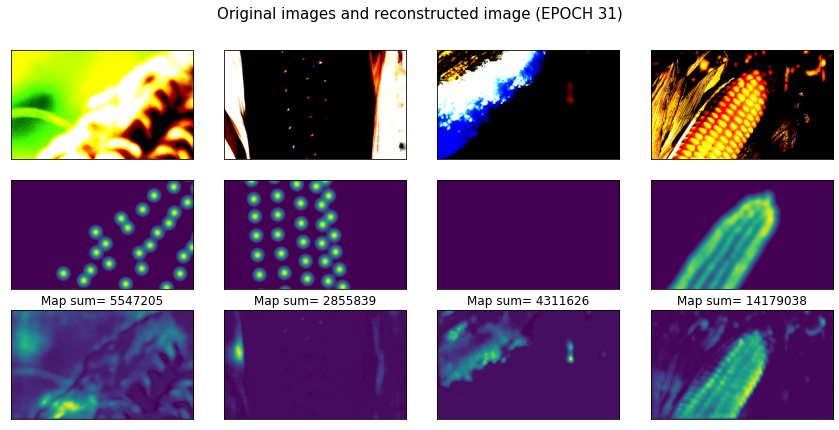

 53%|█████████████████████████████████████████                                    | 32/60 [3:23:46<5:10:54, 666.24s/it]


Epoch: 32/60 -- Epoch Time: 727.65 s
---------------------------------
Train -- Loss: 3340.023
Val -- Loss: 3032.753

Epoch: 33/60 -- Epoch Time: 718.99 s
---------------------------------
Train -- Loss: 3791.286
Val -- Loss: 2919.198


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


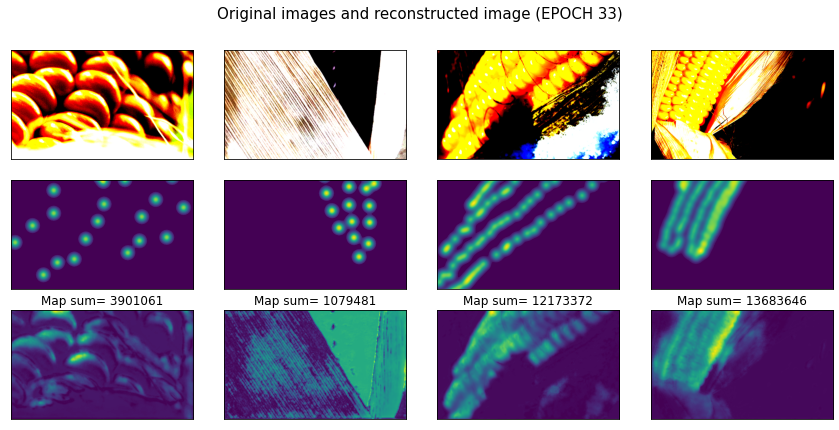

 57%|███████████████████████████████████████████▋                                 | 34/60 [3:48:00<5:02:15, 697.52s/it]


Epoch: 34/60 -- Epoch Time: 728.99 s
---------------------------------
Train -- Loss: 3707.225
Val -- Loss: 3416.993

Epoch: 35/60 -- Epoch Time: 708.75 s
---------------------------------
Train -- Loss: 2893.354
Val -- Loss: 4851.732


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


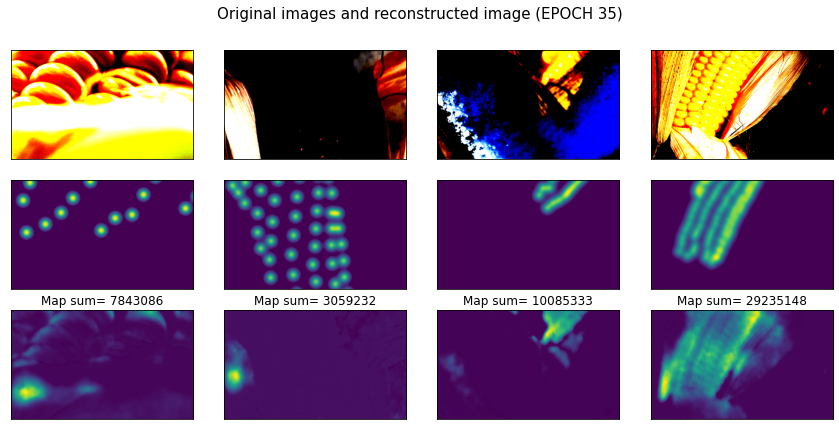

 60%|██████████████████████████████████████████████▏                              | 36/60 [4:11:42<4:41:31, 703.80s/it]


Epoch: 36/60 -- Epoch Time: 705.55 s
---------------------------------
Train -- Loss: 3374.704
Val -- Loss: 3434.818

Epoch: 37/60 -- Epoch Time: 718.50 s
---------------------------------
Train -- Loss: 3538.421
Val -- Loss: 2844.684


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


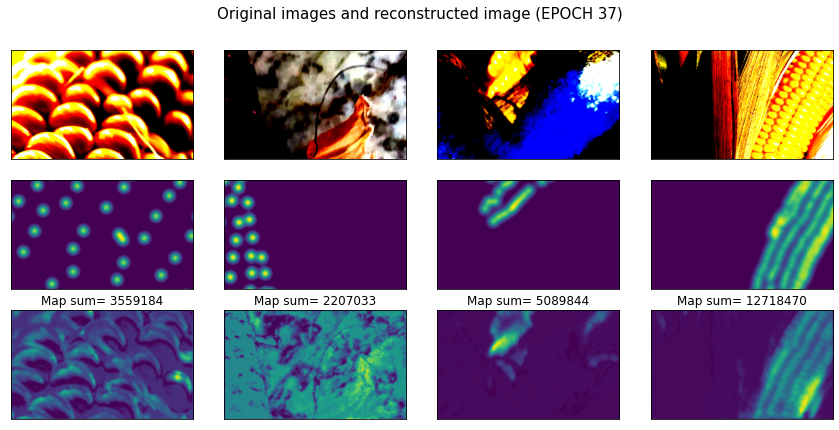

 63%|████████████████████████████████████████████████▊                            | 38/60 [4:35:56<4:22:28, 715.83s/it]


Epoch: 38/60 -- Epoch Time: 728.44 s
---------------------------------
Train -- Loss: 2701.535
Val -- Loss: 2434.078

Epoch: 39/60 -- Epoch Time: 702.92 s
---------------------------------
Train -- Loss: 3411.699
Val -- Loss: 2896.502


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


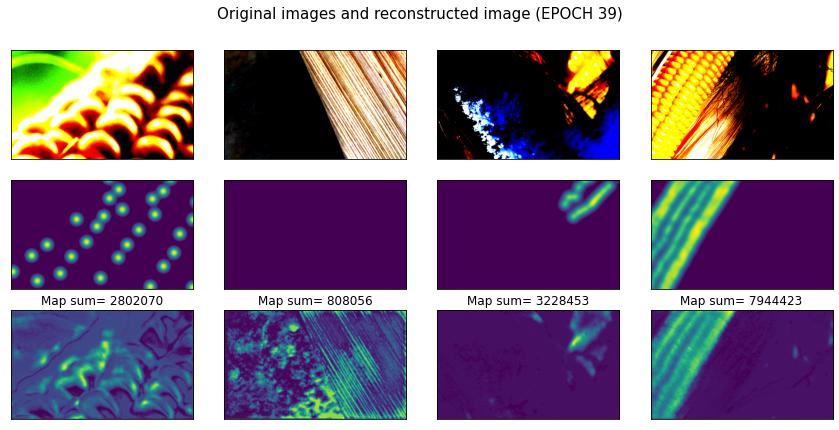

 67%|███████████████████████████████████████████████████▎                         | 40/60 [5:00:46<4:04:35, 733.78s/it]


Epoch: 40/60 -- Epoch Time: 779.75 s
---------------------------------
Train -- Loss: 3038.381
Val -- Loss: 2996.325

Epoch: 41/60 -- Epoch Time: 700.63 s
---------------------------------
Train -- Loss: 2742.346
Val -- Loss: 3041.049


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


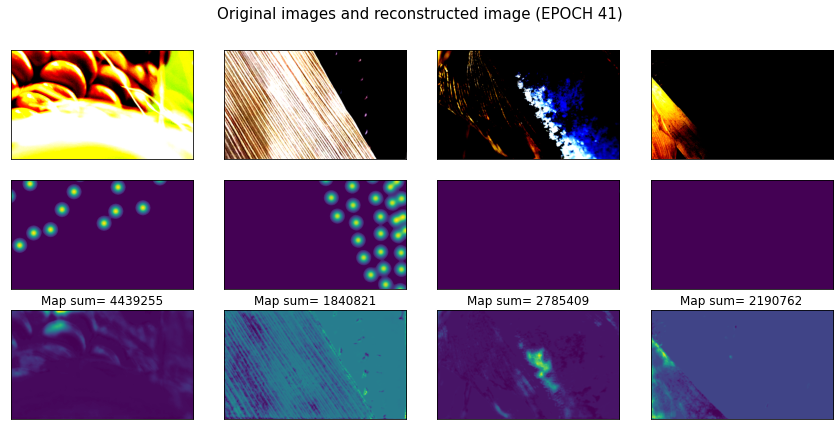

 70%|█████████████████████████████████████████████████████▉                       | 42/60 [5:24:48<3:38:32, 728.45s/it]


Epoch: 42/60 -- Epoch Time: 734.47 s
---------------------------------
Train -- Loss: 2518.087
Val -- Loss: 3048.398

Epoch: 43/60 -- Epoch Time: 720.21 s
---------------------------------
Train -- Loss: 3096.050
Val -- Loss: 5356.172


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


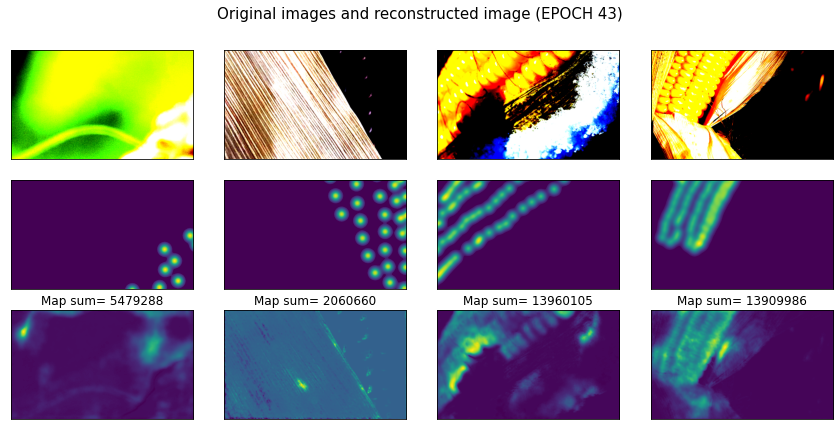

 73%|████████████████████████████████████████████████████████▍                    | 44/60 [5:48:38<3:12:10, 720.63s/it]


Epoch: 44/60 -- Epoch Time: 703.02 s
---------------------------------
Train -- Loss: 2479.565
Val -- Loss: 2837.055

Epoch: 45/60 -- Epoch Time: 696.35 s
---------------------------------
Train -- Loss: 3888.737
Val -- Loss: 3620.582


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


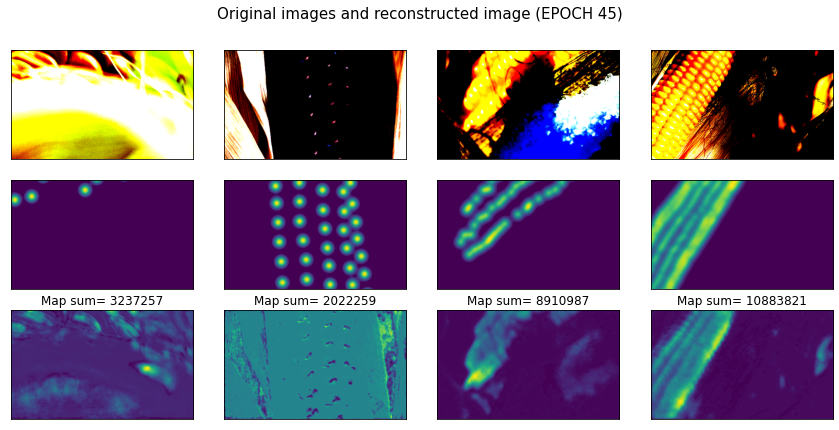

 77%|███████████████████████████████████████████████████████████                  | 46/60 [6:12:14<2:46:44, 714.64s/it]


Epoch: 46/60 -- Epoch Time: 713.10 s
---------------------------------
Train -- Loss: 2837.309
Val -- Loss: 3652.327

Epoch: 47/60 -- Epoch Time: 704.70 s
---------------------------------
Train -- Loss: 2824.744
Val -- Loss: 3620.598


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


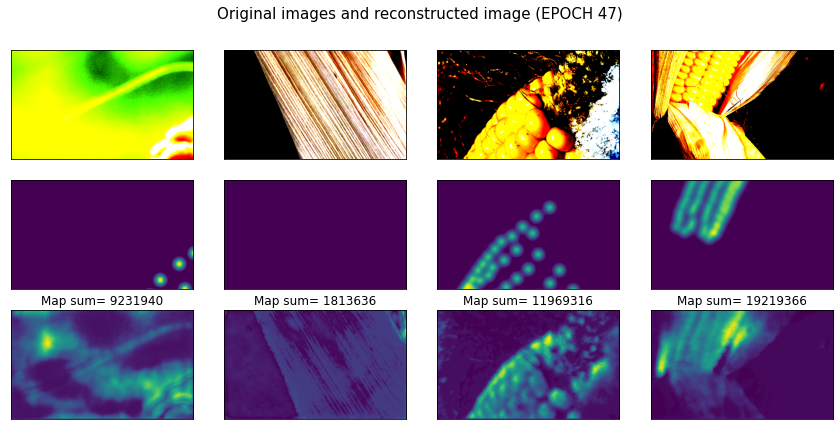

 80%|█████████████████████████████████████████████████████████████▌               | 48/60 [6:35:56<2:22:31, 712.65s/it]


Epoch: 48/60 -- Epoch Time: 709.94 s
---------------------------------
Train -- Loss: 3038.901
Val -- Loss: 4067.927

Epoch: 49/60 -- Epoch Time: 693.11 s
---------------------------------
Train -- Loss: 3041.811
Val -- Loss: 4009.886


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


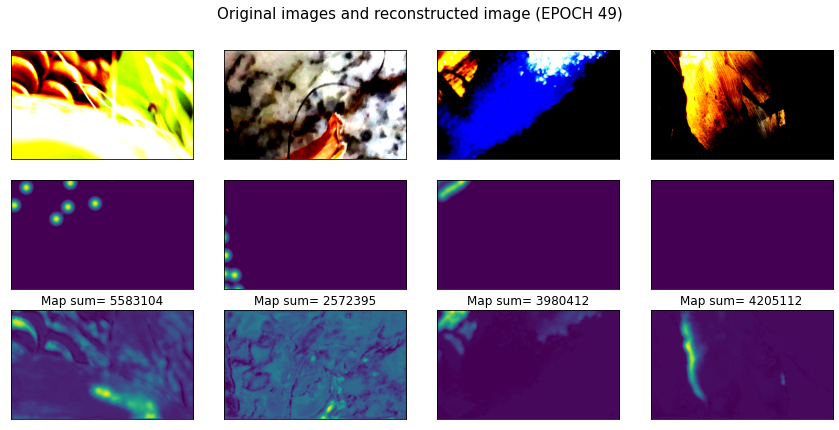

 83%|████████████████████████████████████████████████████████████████▏            | 50/60 [6:58:51<1:56:26, 698.61s/it]


Epoch: 50/60 -- Epoch Time: 674.70 s
---------------------------------
Train -- Loss: 2912.601
Val -- Loss: 2563.713

Epoch: 51/60 -- Epoch Time: 697.22 s
---------------------------------
Train -- Loss: 3512.346
Val -- Loss: 2873.713


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


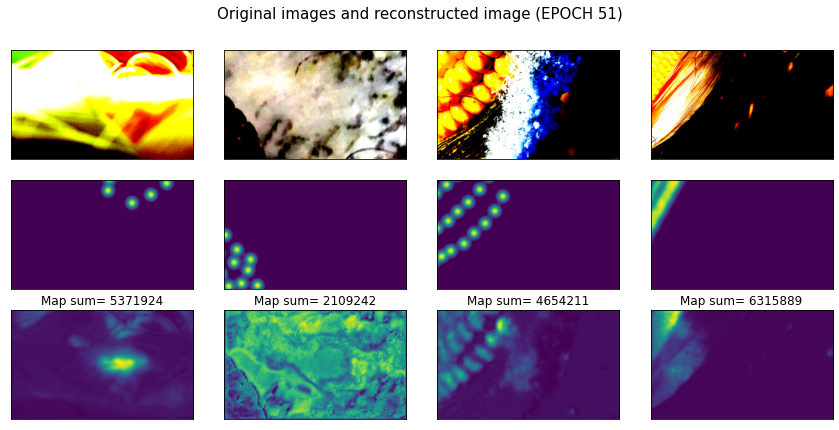

 87%|██████████████████████████████████████████████████████████████████▋          | 52/60 [7:22:30<1:33:57, 704.74s/it]


Epoch: 52/60 -- Epoch Time: 714.99 s
---------------------------------
Train -- Loss: 2671.701
Val -- Loss: 3110.934

Epoch: 53/60 -- Epoch Time: 720.64 s
---------------------------------
Train -- Loss: 2377.719
Val -- Loss: 4972.404


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


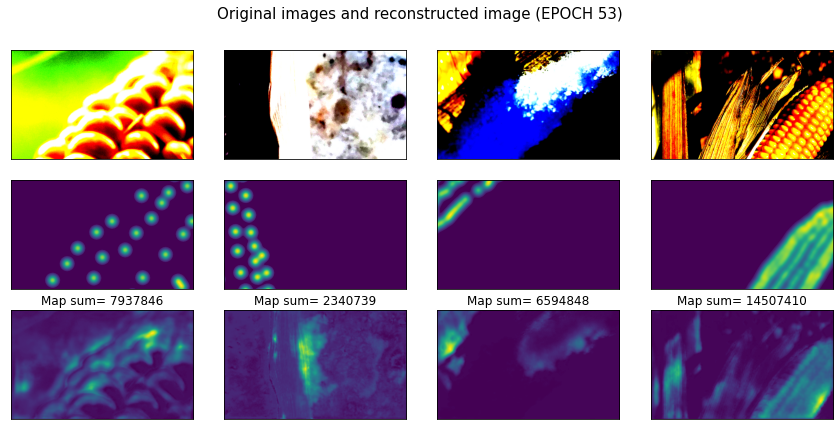

 90%|█████████████████████████████████████████████████████████████████████▎       | 54/60 [7:46:05<1:10:26, 704.43s/it]


Epoch: 54/60 -- Epoch Time: 688.14 s
---------------------------------
Train -- Loss: 3199.754
Val -- Loss: 5250.072

Epoch: 55/60 -- Epoch Time: 688.58 s
---------------------------------
Train -- Loss: 2447.418
Val -- Loss: 2861.563


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


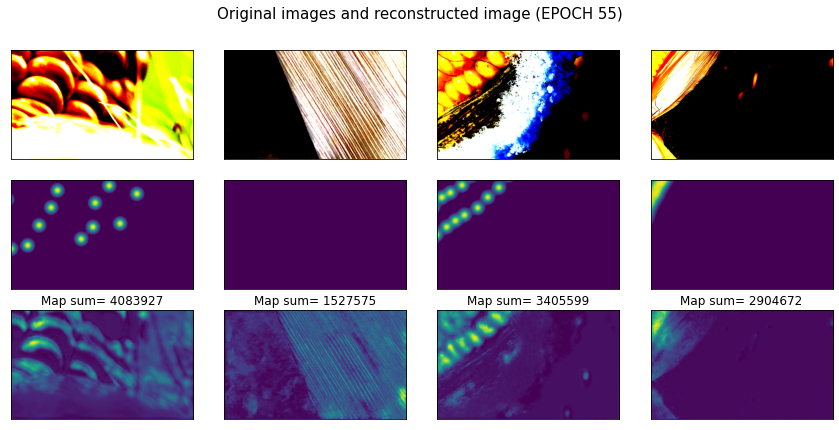

 93%|█████████████████████████████████████████████████████████████████████████▋     | 56/60 [8:09:02<46:22, 695.73s/it]


Epoch: 56/60 -- Epoch Time: 681.96 s
---------------------------------
Train -- Loss: 2215.596
Val -- Loss: 2521.668

Epoch: 57/60 -- Epoch Time: 700.44 s
---------------------------------
Train -- Loss: 2887.580
Val -- Loss: 2787.755


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


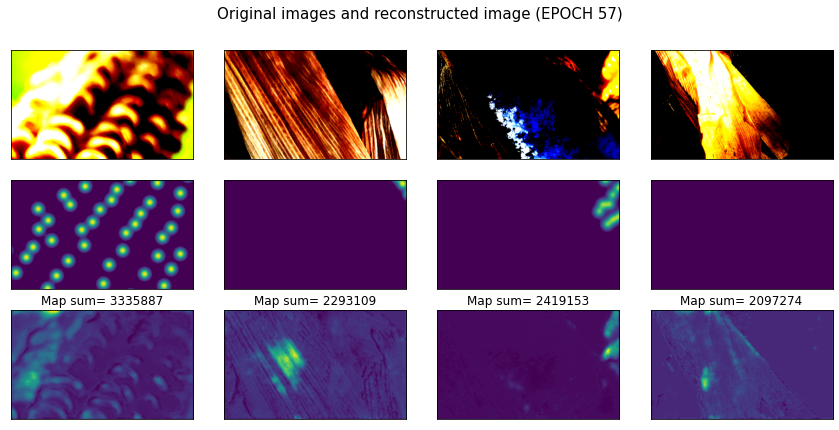

 97%|████████████████████████████████████████████████████████████████████████████▎  | 58/60 [8:32:25<23:16, 698.25s/it]


Epoch: 58/60 -- Epoch Time: 696.46 s
---------------------------------
Train -- Loss: 2189.154
Val -- Loss: 2678.603

Epoch: 59/60 -- Epoch Time: 693.95 s
---------------------------------
Train -- Loss: 2065.577
Val -- Loss: 2783.068


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


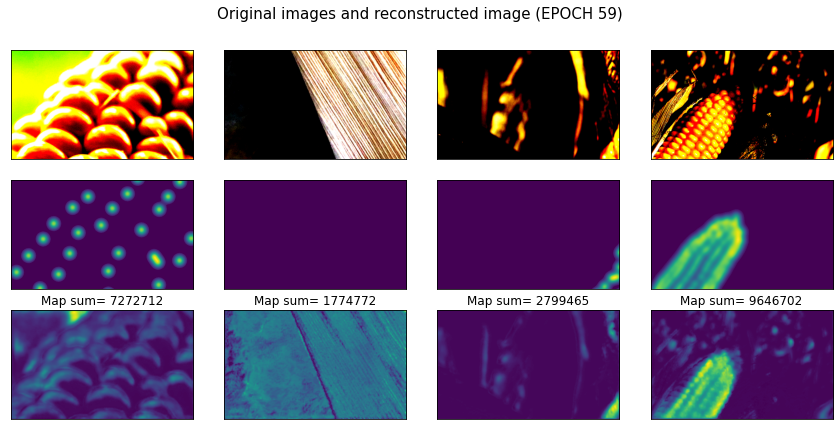

100%|███████████████████████████████████████████████████████████████████████████████| 60/60 [8:55:35<00:00, 535.60s/it]


Epoch: 60/60 -- Epoch Time: 688.68 s
---------------------------------
Train -- Loss: 2628.426
Val -- Loss: 2901.286


In [35]:
writer = SummaryWriter(f"./runs/MOBILENET_{learning_rate}_epochs_{max_epochs}_threshold_{1e-4}_scale_{1e5}")
#writer = SummaryWriter()
train_loss, test_loss = my_functions.training_cycle(model,
                                                    device,
                                                    train_dataloader,
                                                    validation_dataloader,
                                                    validation_dataset,
                                                    loss_fn,
                                                    optimizer,
                                                    max_epochs,
                                                    writer,
                                                    verbose=True)
### To end TensorBoard writings
writer.close()

In [36]:
### Save model
os.makedirs('./Models', exist_ok=True)
epoch = 20
state = {'epoch': epoch + 1, 'state_dict': model.state_dict(),
             'optimizer': optimizer.state_dict(), }

torch.save(state,  f'Models/MOBILENET_{learning_rate}_epochs_{max_epochs}_threshold_{1e-4}_scale_{1e5}.pth')

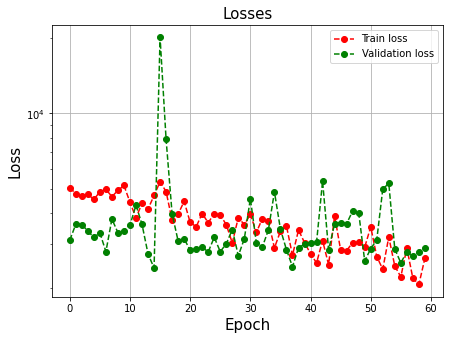

In [37]:
# Plot losses by epoch
plt.figure(figsize=(7,5))
plt.semilogy(train_loss, linestyle='--', marker='o', color='r', label='Train loss')
plt.semilogy(test_loss, linestyle='--', marker='o', color='g', label='Validation loss')
plt.xlabel('Epoch',fontsize=15)
plt.ylabel('Loss',fontsize=15)
#plt.ylim(0,80)
plt.title("Losses",fontsize=15)
plt.grid()
plt.legend()
#plt.savefig('./imgs/classification/losses.svg', format='svg')
plt.show()

# Evaluation

## Loading of the saved model

In [38]:
def load_checkpoint(model, optimizer, filename='checkpoint.pth'):
    # Note: Input model & optimizer should be pre-defined.  This routine only updates their states.
    start_epoch = 0
    if os.path.isfile(filename):
        print("=> loading checkpoint '{}'".format(filename))
        checkpoint = torch.load(filename)
        start_epoch = checkpoint['epoch']
        model.load_state_dict(checkpoint['state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer'])
        #losslogger = checkpoint['losslogger']
        print("=> loaded checkpoint '{}' (epoch {})"
                  .format(filename, checkpoint['epoch']))
    else:
        print("=> no checkpoint found at '{}'".format(filename))

    return model, optimizer, start_epoch

In [26]:
model, optimizer, start_epoch = load_checkpoint(model, optimizer, filename=f'Models/MOBILENET_{learning_rate}_epochs_{max_epochs}_threshold_{1e-4}_scale_{1e5}.pth')
model = model.to(device)
# now individually transfer the optimizer parts...
for state in optimizer.state.values():
    for k, v in state.items():
        if isinstance(v, torch.Tensor):
            state[k] = v.to(device)

=> loading checkpoint 'Models/MOBILENET_0.0005_epochs_60_threshold_0.0001_scale_100000.0.pth'
=> loaded checkpoint 'Models/MOBILENET_0.0005_epochs_60_threshold_0.0001_scale_100000.0.pth' (epoch 21)


## Real testing

In [27]:
def image_disector(original_image,window_h,window_w):
# Retrieve original image, shapes and estimate the number of required windows
#original_image = test_dataset[im][0]
    image_h  =  original_image.shape[1]
    image_w  =  original_image.shape[2]
    n_h = ceil(image_h/window_h)
    n_w = ceil(image_w/window_w)

    # Padd image 
    padded_image = customdataset.padding(n_h*window_h,n_w*window_w)([original_image,original_image])[0]
    # Disect image into windows of required size
    image_sections = []
    for i in [(window_h*k) for k in range(n_h)]:
        for j in [(window_w*k) for k in range(n_w)]:
            image_sections.append(TF.crop(padded_image,i,j,window_h,window_w))

    return padded_image.shape,image_sections

In [28]:
def map_reconstruction(original_image_shape,padded_image_shape,image_sections,window_h,window_w):
    image_h  =  original_image_shape[1]
    image_w  =  original_image_shape[2]
    padded_image_h  =  padded_image_shape[1]
    padded_image_w  =  padded_image_shape[2]
    n_h = ceil(image_h/window_h)
    n_w = ceil(image_w/window_w)
    
    #Recontruct image
    stripes = []
    for i in range(n_h):
        stripes.append(torch.cat((image_sections[(i*n_w):((i+1)*n_w)]), 2))
    reconstructed_img = torch.cat(stripes, 1)
    # Erase padding
    x_ = int(abs((image_h-padded_image_h))/2)
    y_ = int(abs((image_w-padded_image_w))/2)
    
    return TF.crop(reconstructed_img,x_,y_,image_h,image_w)    

In [39]:
#############################
### Evaluation on test set
#############################
final_output = []
for idx in range(len(test_dataset)):
    # get the inputs; data is a list of [inputs, labels]
    inputs, labels, shapes, counts = test_dataset[idx]
    padded_image,image_sections   = image_disector(inputs,window_h=384,window_w=640)
    #padded_labels,labels_sections = image_disector(labels,window_h=384,window_w=640)
        
    image_sections_predictions = []
    for images in image_sections:
        images = images.to(device)
        model.eval()
        with torch.no_grad():
            # forward 
            #pred = 
            image_sections_predictions.append(model(images[None, :])[0])
            #plt.imshow(image_sections_predictions[-1][0][0].numpy())
            #plt.show()
            
    final_output.append(map_reconstruction(inputs.shape,padded_image,image_sections_predictions,window_h=384,window_w=640)[0])
            

plot a few inferences

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


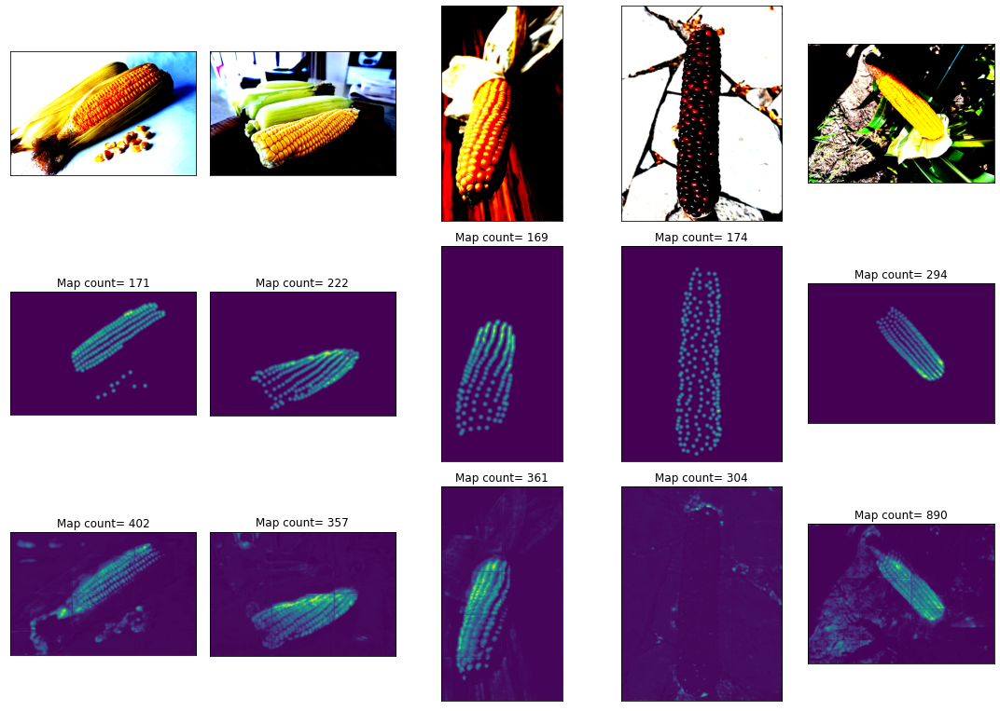

In [46]:
elements = [random.randint(1,40)for i in range(0,5)]#[5,6,7,8,9]

fig, axs = plt.subplots(3, 5, figsize=(15,12))
fig.suptitle("",fontsize=15)
fig.subplots_adjust(top=0.88)
axs = axs.ravel()
for i in range(5):
    idx = elements[i]
    ### Move the images to the right shapes
    img = test_dataset[idx][0].numpy().transpose(1, 2, 0)
    label = test_dataset[idx][1][0].numpy()
    map_ = final_output[idx].numpy()
    
    # Plot the reconstructed image
    axs[i].imshow(img)
    #axs[i].set_title(f"Real count = {counts[idx]}")
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    axs[i+5].imshow(label)
    axs[i+5].set_title(f"Map count= {int(label.sum()/1e5)}")
    axs[i+5].set_xticks([])
    axs[i+5].set_yticks([])
    axs[i+10].imshow(map_)
    axs[i+10].set_title(f"Map count= {int(map_.sum()/1e5)}")
    axs[i+10].set_xticks([])
    axs[i+10].set_yticks([])
plt.tight_layout()
fig.subplots_adjust(top=0.88)

### Evaluation metrics

In [41]:
label_count_list = []
map_count_list = []
for idx in [i for i in range(len(test_dataset))]:
    ### Move the images to the right shapes
    map_ = final_output[idx].numpy()
    
    label = test_dataset[idx][1][0].numpy()
    label_count = int(label.sum()/1e5)
    label_count_list.append(label_count)
    
    map_ = final_output[idx].numpy()
    map_count = int(map_.sum()/1e5)
    map_count_list.append(map_count)

In [42]:
mae = np.sum(np.abs(np.array(label_count_list)-np.array(map_count_list)))/len(map_count_list)
print("MAE = ", mae)

rmse = np.sqrt(np.sum(np.abs(np.array(label_count_list)-np.array(map_count_list))**2)/len(map_count_list))
print("RMSE = ", rmse)

mape = np.sum(np.abs(np.array(label_count_list)-np.array(map_count_list))/np.array(label_count_list)) /len(map_count_list)
print("MAPE = ", mape)

MAE =  322.16129032258067
RMSE =  453.68807673085473
MAPE =  3.983713856326957
